In [ ]:
pip install selenium pillow requests


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4 MB 35.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 499.2/499.2 kB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.8/45.8 kB 2.3 MB/s eta 0:00:00
  Attempting uninstall: typing_extensions
    Found existing installation: typing_extensions 4.14.0
    Uninstalling typing_extensions-4.14.0:
      Successfully uninstalled typing_extensions-4.14.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
typeguard 4.4.3 requires typing_extensions>=4.14.0, but you have typing-extensions 4.13.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cublas-cu12==12.4.5.8; platform_system == "Linux" and platform_machine == "x86_64", but you have nvidia-cublas-cu12 12.5.3.2 which is incompatible.
torch 2.6.0+cu124 requires nvidia-cuda-cupti-cu12==12.4.127; platform_system == "Linux" and pla

# ***High-Resolution Image Extraction from 1900 Minneapolis City Directory using Tiled Rendering***

This script extracts full pages from the 1900 Minneapolis city directory by stitching together individual image tiles. Since the archive serves scanned pages in parts (tiles) instead of full images, tiling was used to reconstruct high-resolution, readable pages for accurate data extraction.





Working on printed page 104 (pg_seq=112)...
Saved to full_pages_1900/page_104.jpg
Working on printed page 105 (pg_seq=113)...
Saved to full_pages_1900/page_105.jpg
Working on printed page 106 (pg_seq=114)...
Saved to full_pages_1900/page_106.jpg
Working on printed page 107 (pg_seq=115)...
Saved to full_pages_1900/page_107.jpg
Working on printed page 108 (pg_seq=116)...
Saved to full_pages_1900/page_108.jpg

Previewing saved pages:


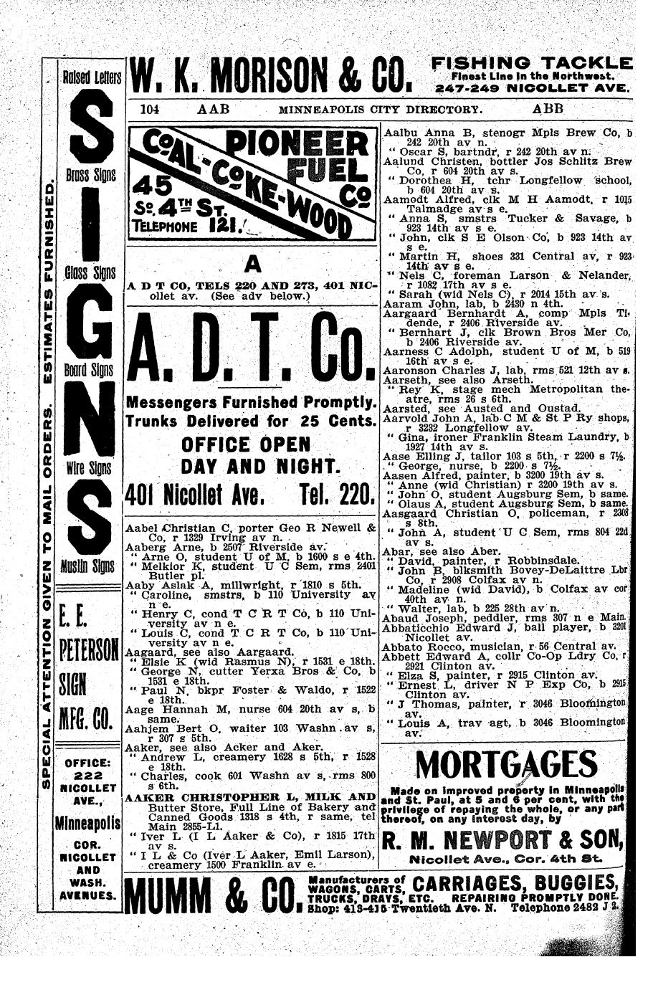

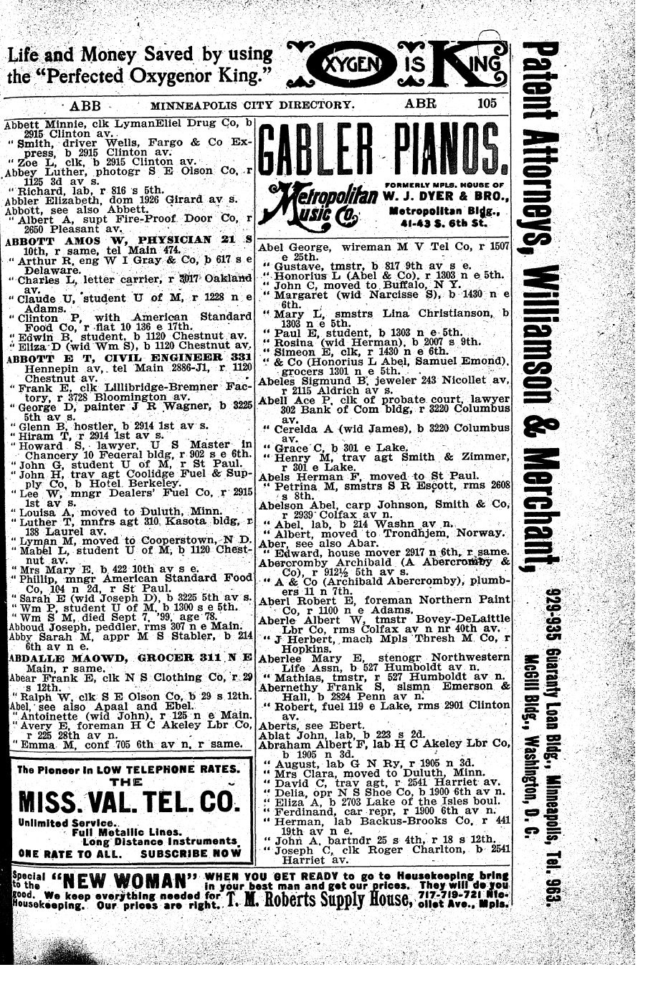

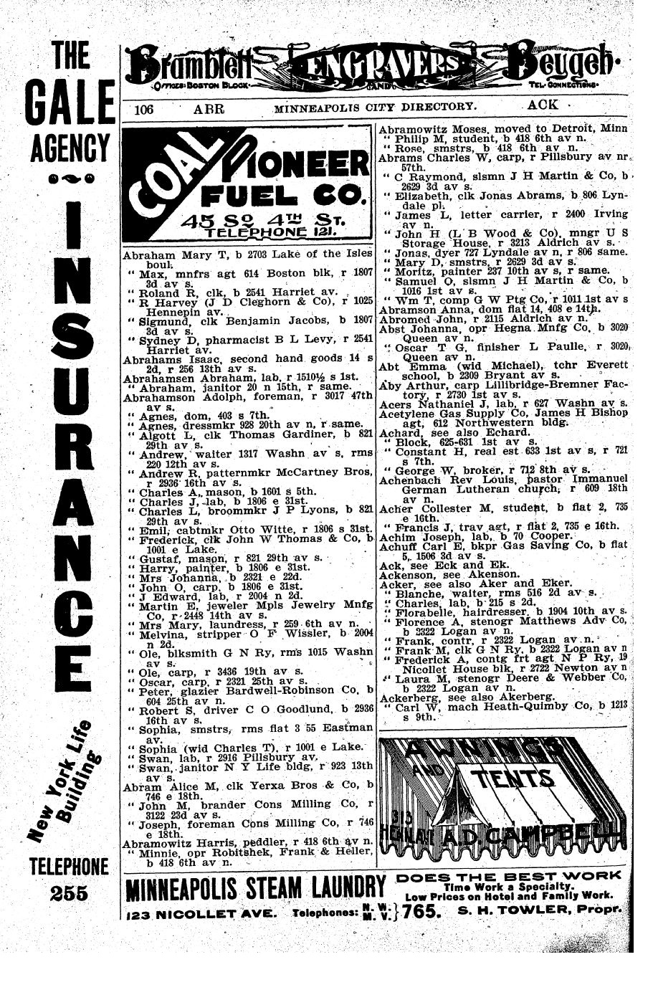

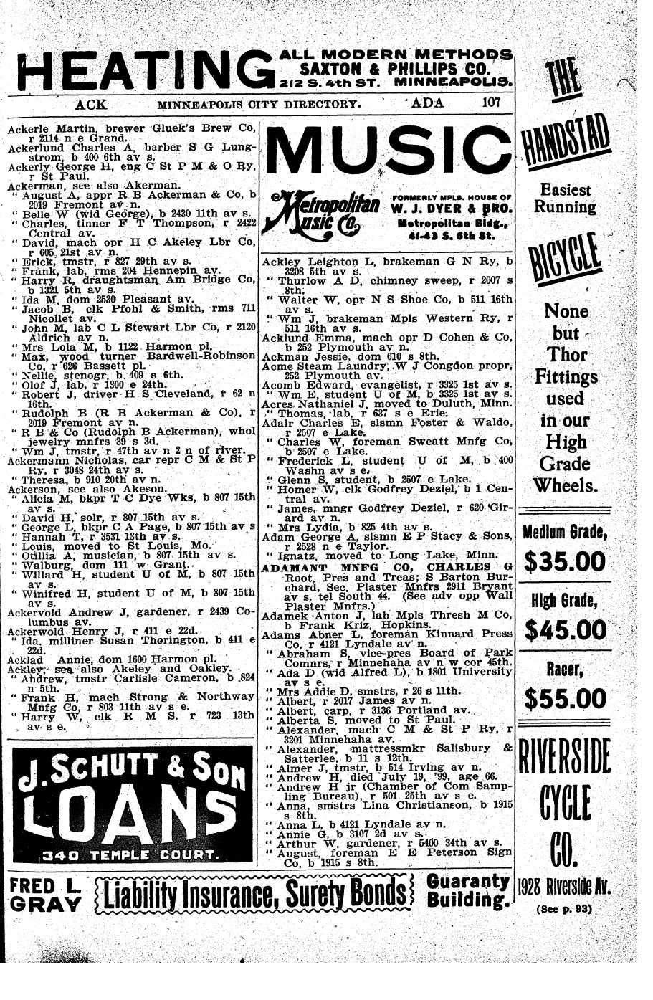

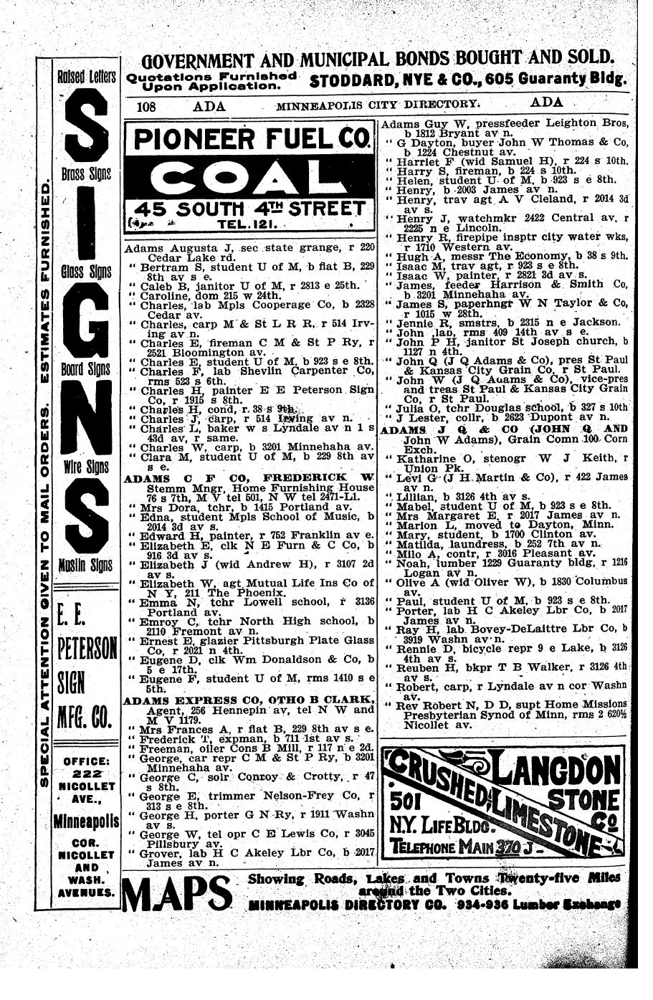

In [ ]:
import os
import requests
from PIL import Image
from io import BytesIO
from IPython.display import display

YEAR = 1900
DOC_ID_SUFFIX = "00000008"

# Output folder setup
output_folder = f"full_pages_{YEAR}"
os.makedirs(output_folder, exist_ok=True)

DOC_ID = f"7083e412-1de2-42fe-b070-7f82e5c869a4/mnmhcl00/20130429/{DOC_ID_SUFFIX}"
SCALE = "0.26125609406366507"

tiles = [
    {"x": 0,   "y": 0,    "w": 512, "h": 512},
    {"x": 512, "y": 0,    "w": 399, "h": 512},
    {"x": 0,   "y": 512,  "w": 512, "h": 512},
    {"x": 512, "y": 512,  "w": 399, "h": 512},
    {"x": 0,   "y": 1024, "w": 512, "h": 371},
    {"x": 512, "y": 1024, "w": 399, "h": 371},
]

BASE_URL = "https://box2.nmtvault.com/Hennepin2/servlet/ImageTileRenderer"

def get_tile(pg_seq, tile_info):
    params = {
        "doc_id": DOC_ID,
        "pg_seq": pg_seq,
        "search_doc": "",
        "scale": SCALE,
        "rotation": "0",
        "x": tile_info["x"],
        "y": tile_info["y"],
        "width": tile_info["w"],
        "height": tile_info["h"]
    }
    response = requests.get(BASE_URL, params=params)
    if response.status_code == 200:
        return Image.open(BytesIO(response.content))
    else:
        raise Exception(f"Failed to download tile for page {pg_seq} at x={tile_info['x']} y={tile_info['y']}")

# pg_seq 112–116 correspond to printed pages 104–108
for i, pg_seq in enumerate(range(112, 117), start=104):
    print(f"Working on printed page {i} (pg_seq={pg_seq})...")

    full_img = Image.new("RGB", (911, 1395), color=(255, 255, 255))

    for j, tile in enumerate(tiles):
        tile_img = get_tile(pg_seq, tile)
        col = j % 2
        row = j // 2
        pos_x = 0 if col == 0 else 512
        pos_y = row * 512 if row < 2 else 1024
        full_img.paste(tile_img, (pos_x, pos_y))

    save_path = os.path.join(output_folder, f"page_{i:03d}.jpg")  # Save using printed page number
    full_img.save(save_path, "JPEG", quality=95)
    print(f"Saved to {save_path}")

# Preview the saved images
print("\nPreviewing saved pages:")
for i in range(104, 109):
    img_path = os.path.join(output_folder, f"page_{i:03d}.jpg")
    img = Image.open(img_path)
    display(img)


# ***OCR Processing and Annotation of Pages (Year 1900)***
script performs OCR on scanned pages (104–108) using Tesseract, annotates recognized text with bounding boxes and labels, and saves both text and annotated images to Google Drive for archival and review.

In [ ]:
# Mount Drive & Install Dependencies
from google.colab import drive
drive.mount('/content/drive')

!apt-get install tesseract-ocr -y
!pip install pytesseract
!pip install pillow

import os
from PIL import Image, ImageDraw, ImageFont
import pytesseract

# Setup folders
YEAR = 1900
input_folder = f"/content/full_pages_{YEAR}"
output_folder = f"/content/drive/MyDrive/{YEAR}/ocr"
os.makedirs(output_folder, exist_ok=True)

# Process pages 104 to 108 (pg_seq 112–116)
for i, pg_seq in enumerate(range(112, 117), start=104):
    input_image_path = os.path.join(input_folder, f"page_{i:03d}.jpg")
    txt_output_path = os.path.join(output_folder, f"page_{i:03d}.txt")
    image_output_path = os.path.join(output_folder, f"page_{i:03d}.jpg")

    try:
        image = Image.open(input_image_path).convert("RGB")
        draw = ImageDraw.Draw(image)

        data = pytesseract.image_to_data(image, output_type=pytesseract.Output.DICT)

        try:
            font = ImageFont.truetype("arial.ttf", 14)
        except:
            font = ImageFont.load_default()

        with open(txt_output_path, "w", encoding="utf-8") as f:
            for j in range(len(data['text'])):
                try:
                    conf = float(data['conf'][j])
                except ValueError:
                    continue

                text = data['text'][j].strip()
                if conf > 60 and text:
                    x, y, w, h = data['left'][j], data['top'][j], data['width'][j], data['height'][j]
                    draw.rectangle([x, y, x + w, y + h], outline="red", width=2)
                    safe_text = text.encode('latin-1', 'ignore').decode('latin-1')
                    draw.text((x, y - 12), safe_text, fill="blue", font=font)
                    f.write(f"{text}\n")

        image.save(image_output_path, "JPEG", quality=95)
        print(f"Page {i}: OCR complete and saved to Drive")

    except Exception as e:
        print(f"Failed page {i}: {e}")


Mounted at /content/drive
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
Page 104: OCR complete and saved to Drive
Page 105: OCR complete and saved to Drive
Page 106: OCR complete and saved to Drive
Page 107: OCR complete and saved to Drive
Page 108: OCR complete and saved to Drive


# ***AI-Assisted OCR Enhancement***
Description:
This pipeline combines traditional OCR (Tesseract) with Google’s Gemini AI model to enhance the accuracy of digitizing historical directory pages. Tesseract extracts raw text, while Gemini refines it—correcting OCR errors and reconstructing structured data like names, addresses, and occupations—ensuring cleaner, human-readable outputs.


> ***Why Use AI with OCR in This Case:***


1.   Improve Accuracy: Tesseract often struggles with old fonts, faded prints, or skewed layouts. Gemini helps interpret context and correct OCR errors that Tesseract alone cannot.
2.   Semantic Reconstruction: AI understands and reconstructs full entities (e.g., splitting "Jhn Smt" into "John Smith")—which is especially useful for historical data digitization.
3. Automation of Post-OCR Cleanup: Manual cleanup is labor-intensive; AI automates it, saving time while increasing consistency and quality.

In [ ]:
# Mount Drive and install dependencies
from google.colab import drive
drive.mount('/content/drive')

!apt-get install tesseract-ocr -y
!pip install pytesseract pillow google-generativeai
# Import libraries
import os
from PIL import Image
import pytesseract
import google.generativeai as genai

# Configure Gemini (NEW MODEL)
genai.configure(api_key="###################")
model = genai.GenerativeModel("gemini-1.5-flash")

# Setup folders
YEAR = 1900
input_folder = f"/content/full_pages_{YEAR}"
output_folder = f"/content/drive/MyDrive/{YEAR}_AI/ocr_ai"
os.makedirs(output_folder, exist_ok=True)

# Convert PIL image for Gemini
def load_image_for_gemini(path):
    return Image.open(path).convert("RGB")

# Process each image: Tesseract + Gemini
for i in range(104, 109):  # page_104.jpg to page_108.jpg
    img_path = os.path.join(input_folder, f"page_{i:03d}.jpg")
    txt_path = os.path.join(output_folder, f"page_{i:03d}.txt")

    try:
        print(f"Processing page_{i:03d}.jpg")

        # Step 1: Run Tesseract OCR
        image = load_image_for_gemini(img_path)
        ocr_text = pytesseract.image_to_string(image)

        # Step 2: Gemini Prompt (with image + OCR)
        prompt = (
            "You are given the scanned image of a historical city directory page and the OCR output below. "
            "Using both, correct errors, reconstruct full names, addresses, and occupations, and return the cleaned plain text. "
            "Do not invent information.\n\n"
            f"OCR OUTPUT:\n{ocr_text}"
        )

        response = model.generate_content([prompt, image])
        cleaned_text = response.text

        with open(txt_path, "w", encoding="utf-8") as f:
            f.write(cleaned_text)

        print(f"Saved AI-enhanced text to: {txt_path}")

    except Exception as e:
        print(f"Error processing page {i}: {e}")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
Processing page_104.jpg
Saved AI-enhanced text to: /content/drive/MyDrive/1900_AI/ocr_ai/page_104.txt
Processing page_105.jpg
Saved AI-enhanced text to: /content/drive/MyDrive/1900_AI/ocr_ai/page_105.txt
Processing page_106.jpg
Saved AI-enhanced text to: /content/drive/MyDrive/1900_AI/ocr_ai/page_106.txt
Processing page_107.jpg
Saved AI-enhanced text to: /content/drive/MyDrive/1900_AI/ocr_ai/page_107.txt
Processing page_108.jpg
Saved AI-enhanced text to: /content/drive/MyDrive/1900_AI/ocr_ai/page_108.txt


# ***All together sending output images and text extrcated to drive***

In [ ]:
# Step 2: Run hybrid pipeline with bounding boxes + Gemini cleanup
import os
from PIL import Image, ImageDraw, ImageFont
import pytesseract
import google.generativeai as genai

# Gemini configuration
genai.configure(api_key="##############")
model = genai.GenerativeModel("gemini-1.5-flash")

# Folder setup
YEAR = 1900
input_folder = f"/content/full_pages_{YEAR}"
base_output = f"/content/drive/MyDrive/outputs/{YEAR}/OCR+AI"
text_output = os.path.join(base_output, "text")
image_output = os.path.join(base_output, "images")
os.makedirs(text_output, exist_ok=True)
os.makedirs(image_output, exist_ok=True)

# Font setup
try:
    font = ImageFont.truetype("arial.ttf", 14)
except:
    font = ImageFont.load_default()

# Process each image
for i in range(104, 109):
    image_name = f"page_{i:03d}.jpg"
    img_path = os.path.join(input_folder, image_name)
    txt_path = os.path.join(text_output, f"page_{i:03d}.txt")
    boxed_img_path = os.path.join(image_output, image_name)

    try:
        print(f"Processing {image_name}...")

        # Step 1: Load image + run Tesseract OCR with bounding box data
        image = Image.open(img_path).convert("RGB")
        draw = ImageDraw.Draw(image)
        data = pytesseract.image_to_data(image, output_type=pytesseract.Output.DICT)

        ocr_text = ""
        for j in range(len(data['text'])):
            text = data['text'][j].strip()
            try:
                conf = float(data['conf'][j])
            except:
                continue
            if conf > 60 and text:
                x, y, w, h = data['left'][j], data['top'][j], data['width'][j], data['height'][j]
                draw.rectangle([x, y, x + w, y + h], outline="red", width=2)
                draw.text((x, y - 12), text.encode("latin-1", "ignore").decode("latin-1"), fill="blue", font=font)
                ocr_text += text + "\n"

        # Save annotated image with bounding boxes
        image.save(boxed_img_path, "JPEG", quality=95)

        # Step 2: Pass image + OCR text to Gemini
        prompt = (
            "This is a scanned page from a historical city directory. "
            "Using the image and the OCR output below, clean up errors, fix formatting, "
            "and return the most accurate plain text representation. Do not add extra information.\n\n"
            f"OCR OUTPUT:\n{ocr_text}"
        )
        response = model.generate_content([prompt, image])
        cleaned_text = response.text

        # Step 3: Save cleaned text from Gemini
        with open(txt_path, "w", encoding="utf-8") as f:
            f.write(cleaned_text)

        print(f"Saved text → {txt_path}")
        print(f"Saved image → {boxed_img_path}")

    except Exception as e:
        print(f"Error processing page {i}: {e}")


Processing page_104.jpg...
Saved text → /content/drive/MyDrive/outputs/1900/OCR+AI/text/page_104.txt
Saved image → /content/drive/MyDrive/outputs/1900/OCR+AI/images/page_104.jpg
Processing page_105.jpg...
Saved text → /content/drive/MyDrive/outputs/1900/OCR+AI/text/page_105.txt
Saved image → /content/drive/MyDrive/outputs/1900/OCR+AI/images/page_105.jpg
Processing page_106.jpg...
Saved text → /content/drive/MyDrive/outputs/1900/OCR+AI/text/page_106.txt
Saved image → /content/drive/MyDrive/outputs/1900/OCR+AI/images/page_106.jpg
Processing page_107.jpg...
Saved text → /content/drive/MyDrive/outputs/1900/OCR+AI/text/page_107.txt
Saved image → /content/drive/MyDrive/outputs/1900/OCR+AI/images/page_107.jpg
Processing page_108.jpg...
Saved text → /content/drive/MyDrive/outputs/1900/OCR+AI/text/page_108.txt
Saved image → /content/drive/MyDrive/outputs/1900/OCR+AI/images/page_108.jpg


# ***JSON File entities Extrcation***



# #***Step 1: OCR Text Cleanup***

Tesseract OCR extracts raw text from scanned historical city directory pages.

Google Gemini 1.5 Flash refines the OCR output by correcting errors and formatting it into readable text.

# #***Step 2: JSON Data Structuring via Gemini AI***

Each cleaned .txt file is read and sent to Gemini with a specific prompt.

The prompt instructs Gemini to extract key-value pairs for each person listed, following a defined JSON schema:

In [ ]:
# Step 1: Install dependencies
!pip install -U google-generativeai
# Step 2: Generate JSON outputs from cleaned .txt files
import os
import google.generativeai as genai
import json

# Configure Gemini
genai.configure(api_key="###################")
model = genai.GenerativeModel("gemini-1.5-flash")

# Input/output paths
text_input_dir = "/content/drive/MyDrive/outputs/1900/OCR+AI/text"
json_output_dir = "/content/drive/MyDrive/outputs/1900/OCR+AI/json"
os.makedirs(json_output_dir, exist_ok=True)

# Loop through cleaned text files
for filename in sorted(os.listdir(text_input_dir)):
    if filename.endswith(".txt"):
        page_num = int(filename.replace("page_", "").replace(".txt", ""))
        txt_path = os.path.join(text_input_dir, filename)
        json_path = os.path.join(json_output_dir, filename.replace(".txt", ".json"))

        with open(txt_path, "r", encoding="utf-8") as f:
            cleaned_text = f.read()

        # Gemini prompt
        prompt = f"""
You are a data extractor. The following text is from a scanned page of the Minneapolis 1900 city directory.
Extract each individual/person and convert it into this JSON format:

{{
"FirstName": "",
"LastName": "",
"Spouse": "",
"Occupation": "",
"CompanyName": "",
"HomeAddress": {{
  "StreetNumber": "",
  "StreetName": "",
  "ApartmentOrUnit": "",
  "ResidenceIndicator": ""
}},
"WorkAddress": null,
"Telephone": null,
"DirectoryName": "Minneapolis 1900",
"PageNumber": {page_num}
}}

The text may contain multiple people. Return a list of JSON objects.
Do not fabricate information. Use null if data is missing. Try to match line by line if possible.

TEXT:
\"\"\"
{cleaned_text}
\"\"\"
"""

        try:
            response = model.generate_content(prompt)
            json_output = response.text.strip()

            # Save raw output to .json
            with open(json_path, "w", encoding="utf-8") as f:
                f.write(json_output)

            print(f"Saved structured JSON → {json_path}")

        except Exception as e:
            print(f"Error processing {filename}: {e}")


Saved structured JSON → /content/drive/MyDrive/outputs/1900/OCR+AI/json/page_104.json
Saved structured JSON → /content/drive/MyDrive/outputs/1900/OCR+AI/json/page_105.json
Saved structured JSON → /content/drive/MyDrive/outputs/1900/OCR+AI/json/page_106.json
Saved structured JSON → /content/drive/MyDrive/outputs/1900/OCR+AI/json/page_107.json
Saved structured JSON → /content/drive/MyDrive/outputs/1900/OCR+AI/json/page_108.json



# **Final VErsion Accurate JSON Extraction from OCR Text Using Gemini with Image Contextualization**



✅ Step 1: Input Preparation
Directories are set for:

Cleaned OCR text files (text_dir)

Raw scanned images (raw_image_dir)

Bounding box–annotated images (bbox_image_dir)

Final JSON outputs (json_dir)

Each text file (page_104.txt to page_108.txt) represents cleaned OCR data for one page.

✅ Step 2: Prompt Engineering for Gemini
A strong, example-driven prompt is crafted for high-accuracy data extraction.

Includes a real JSON template to instruct Gemini on the expected output format.

Specifies clear rules:

Use context to fix OCR errors.

Extract structured details like FirstName, Spouse, Occupation, etc.

Return only valid JSON (no extra comments or explanations).

Use null where data is missing.

✅ Step 3: Dual-Image Context Usage
Both the original scanned image and the bounding-box annotated image are passed to Gemini.

This dual-visual input boosts Gemini’s understanding:

Raw image gives original layout and text context.

Annotated image highlights detected text locations and boosts positional accuracy.

✅ Step 4: Structured Output Generation
Gemini responds with a clean JSON array of individuals listed on the page.

The JSON is saved to Google Drive, one file per page.

In [ ]:
# Step 2: Generate cleaned JSON with extra instructions for accuracy
import os
from PIL import Image
import google.generativeai as genai

# Gemini config
genai.configure(api_key="############")
model = genai.GenerativeModel("gemini-1.5-flash")

# Folder paths
base_dir = "/content/drive/MyDrive/outputs/1900/OCR+AI"
text_dir = os.path.join(base_dir, "text")
json_dir = os.path.join(base_dir, "json")
raw_image_dir = "/content/full_pages_1900"
bbox_image_dir = os.path.join(base_dir, "images")
os.makedirs(json_dir, exist_ok=True)

# JSON schema sample
json_template = """{
"FirstName": "Peter D",
"LastName": "Aadland",
"Spouse": "Pearl R",
"Occupation": "Salesman",
"CompanyName": "Lifetime Sls",
"HomeAddress": {
  "StreetNumber": "2103",
  "StreetName": "Bryant av S",
  "ApartmentOrUnit": "apt 1",
  "ResidenceIndicator": "h"
},
"WorkAddress": null,
"Telephone": null,
"DirectoryName": "Minneapolis 1900",
"PageNumber": 32
}"""

# Enhanced prompt for Gemini
def build_prompt(cleaned_text, page_number):
    return f"""
You are a precise data extraction assistant for historical directories.

You will be given:
- A scanned image of a Minneapolis 1900 city directory page
- A bounding-box marked version of that image
- Cleaned OCR text extracted from the image

Your task is to extract structured data of **individuals listed on this page** and format each entry as a JSON object.

Each object should follow this exact schema:
{json_template}

Instructions:
- Parse **full names**, **spouses**, **occupations**, **company names**, and **residential addresses**.
- Correct common OCR spelling errors where possible using the image and context.
- Carefully match residence indicators like `h` (home), `r` (room), and unit numbers like `apt 1`.
- Leave "Telephone" and "WorkAddress" as `null` unless clearly specified.
- Use `null` for any missing data.
- Use "Minneapolis 1900" as the DirectoryName and {page_number} as the PageNumber.
- Return ONLY a valid JSON array of such entries. Do not include any comments or explanations.

CLEANED TEXT:
\"\"\"
{cleaned_text}
\"\"\"
"""

# Main processing loop
for filename in sorted(os.listdir(text_dir)):
    if filename.endswith(".txt"):
        page_number = int(filename.replace("page_", "").replace(".txt", ""))
        txt_path = os.path.join(text_dir, filename)
        raw_img_path = os.path.join(raw_image_dir, f"page_{page_number:03d}.jpg")
        bbox_img_path = os.path.join(bbox_image_dir, f"page_{page_number:03d}.jpg")
        json_out_path = os.path.join(json_dir, f"page_{page_number:03d}.json")

        if not os.path.exists(raw_img_path) or not os.path.exists(bbox_img_path):
            print(f"Missing image(s) for page {page_number}")
            continue

        try:
            with open(txt_path, "r", encoding="utf-8") as f:
                cleaned_text = f.read()

            prompt = build_prompt(cleaned_text, page_number)
            raw_image = Image.open(raw_img_path)
            bbox_image = Image.open(bbox_img_path)

            response = model.generate_content([prompt, raw_image, bbox_image])
            json_output = response.text.strip()

            with open(json_out_path, "w", encoding="utf-8") as out:
                out.write(json_output)

            print(f"JSON saved for page {page_number}")

        except Exception as e:
            print(f" Error on page {page_number}: {e}")


JSON saved for page 104
JSON saved for page 105
JSON saved for page 106
JSON saved for page 107
JSON saved for page 108
